# Exploration des données

In [1]:
# Import libraries
import pandas as pd
import numpy as np
from pathlib import Path
from datetime import datetime
import os
import pickle
from time import time
from random import randint
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

### Articles metadata

In [2]:
df_articles_meta=pd.read_csv("articles_metadata.csv")
df_articles_meta.describe()

,article_id,category_id,created_at_ts,publisher_id,words_count
count,364047.000000,364047.000000,3.640470e+05,364047.0,364047.000000
mean,182023.000000,283.108239,1.474070e+12,0.0,190.897727
std,105091.461061,136.723470,4.293038e+10,0.0,59.502766
min,0.000000,0.000000,1.159356e+12,0.0,0.000000
25%,91011.500000,199.000000,1.444925e+12,0.0,159.000000
50%,182023.000000,301.000000,1.489422e+12,0.0,186.000000
75%,273034.500000,399.000000,1.509891e+12,0.0,218.000000
max,364046.000000,460.000000,1.520943e+12,0.0,6690.000000


In [3]:
df_articles_meta.head()

,article_id,category_id,created_at_ts,publisher_id,words_count
0,0,0,1513144419000,0,168
1,1,1,1405341936000,0,189
2,2,1,1408667706000,0,250
3,3,1,1408468313000,0,230
4,4,1,1407071171000,0,162


In [4]:
df_articles_meta['created_at_ts']=pd.to_datetime(df_articles_meta['created_at_ts'],unit='ms')
df_articles_meta['created_at_ts'] = pd.to_datetime(df_articles_meta['created_at_ts'].dt.strftime('%Y/%m/%d'))
df_articles_meta.head()

,article_id,category_id,created_at_ts,publisher_id,words_count
0,0,0,2017-12-13,0,168
1,1,1,2014-07-14,0,189
2,2,1,2014-08-22,0,250
3,3,1,2014-08-19,0,230
4,4,1,2014-08-03,0,162


In [5]:
df_articles_meta.isna().sum()

article_id       0
category_id      0
created_at_ts    0
publisher_id     0
words_count      0
dtype: int64

In [6]:
# Valeurs uniques
for col in df_articles_meta.columns:
    print(col, ' :', df_articles_meta[col].nunique())

article_id  : 364047
category_id  : 461
created_at_ts  : 2302
publisher_id  : 1
words_count  : 866


In [7]:
df_articles_meta["category_id"]=df_articles_meta["category_id"].astype("category")

In [8]:
df_articles_meta["category_id"].value_counts()

281    12817
375    10005
399     9049
412     8648
431     7759
       ...  
341        1
121        1
335        1
131        1
0          1
Name: category_id, Length: 461, dtype: int64

<AxesSubplot:>

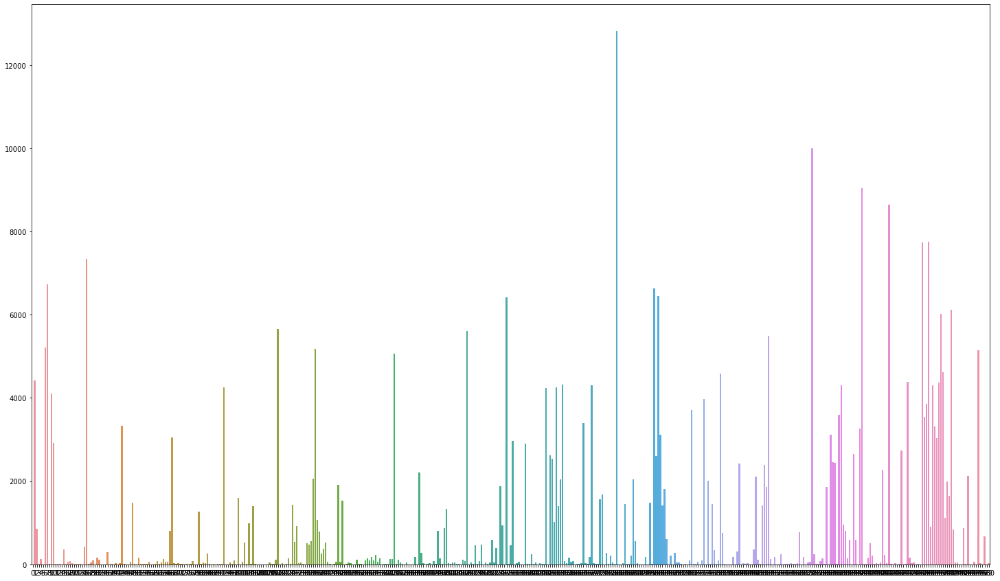

In [ ]:
# Articles Categories distribution
#pd.options.plotting.backend = "plotly"

plt.figure(figsize=(25, 15))
comptage_category = df_articles_meta["category_id"].value_counts()
#sns.barplot(data=comptage_category)
sns.barplot(x=comptage_category.index, y=comptage_category.values)

# df_articles_meta["category_id"].value_counts().plot(
#     kind="bar",
#     labels={
#        "index": "Category ID",
#        "value": "Count",
#     },
#     color="value",
#     title="Distribution of categories",
# )

In [ ]:
## Visualize Articles Word count distribution

df_articles_meta["category_id"].plot(
    kind="histogram",
    title="Distribution of categories",
    # labels={
    #     "value": "category_id",
    # },
    text_auto=True,
    marginal="box",
)

In [ ]:
## Visualize Articles Creation time distribution

df_articles_meta.sample(frac=0.01)["created_at_ts"].plot(
    kind="histogram",
    title="Distribution of creation time (sampling = 1%)",
    labels={
        "value": "Creation time",
    },
    text_auto=True,
    marginal="box",
)

In [ ]:
## Visualize Articles Word count distribution

df_articles_meta["words_count"].sample(frac=0.01).plot(
    kind="histogram",
    title="Distribution of words count (sampling = 1%)",
    labels={
        "value": "Words count",
    },
    text_auto=True,
    marginal="box",
)

## Dossier Clicks

In [10]:
df_clicks_sample=pd.read_csv("clicks_sample.csv")
df_clicks_sample.describe()

,user_id,session_id,session_start,session_size,click_article_id,click_timestamp,click_environment,click_deviceGroup,click_os,click_country,click_region,click_referrer_type
count,1883.000000,1.883000e+03,1.883000e+03,1883.000000,1883.000000,1.883000e+03,1883.000000,1883.000000,1883.000000,1883.000000,1883.000000,1883.000000
mean,355.893787,1.506828e+15,1.506828e+12,3.459904,176717.848646,1.506830e+12,3.917153,2.305895,12.113648,1.491768,18.774827,1.764206
std,206.162865,8.679628e+08,8.679468e+05,3.037467,82324.177259,1.064938e+07,0.410461,1.062301,7.825735,2.007772,7.083400,1.225679
min,0.000000,1.506825e+15,1.506825e+12,2.000000,2137.000000,1.506827e+12,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000
25%,181.500000,1.506827e+15,1.506827e+12,2.000000,108854.000000,1.506828e+12,4.000000,1.000000,2.000000,1.000000,13.000000,1.000000
50%,353.000000,1.506828e+15,1.506828e+12,3.000000,157541.000000,1.506828e+12,4.000000,3.000000,17.000000,1.000000,21.000000,1.000000
75%,537.000000,1.506828e+15,1.506828e+12,4.000000,236697.500000,1.506829e+12,4.000000,3.000000,19.000000,1.000000,25.000000,2.000000
max,706.000000,1.506829e+15,1.506829e+12,24.000000,363291.000000,1.506998e+12,4.000000,4.000000,20.000000,11.000000,28.000000,7.000000


In [11]:
# Lecture des fichiers dans le dossier Clicks

click_path=Path('Clicks')

file_click = sorted(os.listdir(click_path))
click_list = []

for i in range(0, len(file_click)):
    temp = pd.read_csv(click_path / file_click[i])
    temp['filename'] = i
    click_list.append(temp)

df_clicks = pd.concat(click_list, axis=0, ignore_index=True)

df_clicks.head()

,user_id,session_id,session_start,session_size,click_article_id,click_timestamp,click_environment,click_deviceGroup,click_os,click_country,click_region,click_referrer_type,filename
0,0,1506825423271737,1506825423000,2,157541,1506826828020,4,3,20,1,20,2,0
1,0,1506825423271737,1506825423000,2,68866,1506826858020,4,3,20,1,20,2,0
2,1,1506825426267738,1506825426000,2,235840,1506827017951,4,1,17,1,16,2,0
3,1,1506825426267738,1506825426000,2,96663,1506827047951,4,1,17,1,16,2,0
4,2,1506825435299739,1506825435000,2,119592,1506827090575,4,1,17,1,24,2,0


In [12]:
df_clicks.rename(columns={'click_article_id':'article_id'}, inplace=True)

# Convertion en format date
dates = ['session_start', 'click_timestamp']
for col in dates:
    df_clicks[col] = pd.to_datetime(df_clicks[col], unit='ms')

print('Shape', df_clicks.shape)
df_clicks.head()

Shape (2988181, 13)


,user_id,session_id,session_start,session_size,article_id,click_timestamp,click_environment,click_deviceGroup,click_os,click_country,click_region,click_referrer_type,filename
0,0,1506825423271737,2017-10-01 02:37:03,2,157541,2017-10-01 03:00:28.020,4,3,20,1,20,2,0
1,0,1506825423271737,2017-10-01 02:37:03,2,68866,2017-10-01 03:00:58.020,4,3,20,1,20,2,0
2,1,1506825426267738,2017-10-01 02:37:06,2,235840,2017-10-01 03:03:37.951,4,1,17,1,16,2,0
3,1,1506825426267738,2017-10-01 02:37:06,2,96663,2017-10-01 03:04:07.951,4,1,17,1,16,2,0
4,2,1506825435299739,2017-10-01 02:37:15,2,119592,2017-10-01 03:04:50.575,4,1,17,1,24,2,0


In [13]:
# Valeurs uniques
for col in df_clicks.columns:
    print(col, ' :', df_clicks[col].nunique())

user_id  : 322897
session_id  : 1048594
session_start  : 646874
session_size  : 72
article_id  : 46033
click_timestamp  : 2983198
click_environment  : 3
click_deviceGroup  : 5
click_os  : 8
click_country  : 11
click_region  : 28
click_referrer_type  : 7
filename  : 384


In [ ]:
df_clicks.isna().sum()

user_id                0
session_id             0
session_start          0
session_size           0
article_id             0
click_timestamp        0
click_environment      0
click_deviceGroup      0
click_os               0
click_country          0
click_region           0
click_referrer_type    0
filename               0
dtype: int64

## Dossier Embeddings Pickle

In [14]:
with open('articles_embeddings.pickle', 'rb') as file:
    pickle_embeddings = pickle.load(file)

pickle_embeddings.shape

(364047, 250)

In [15]:
df_embeddings=pd.DataFrame(pickle_embeddings)
df_embeddings.head()

,0,1,2,3,4,5,6,7,8,9,...,240,241,242,243,244,245,246,247,248,249
0,-0.161183,-0.957233,-0.137944,0.050855,0.830055,0.901365,-0.335148,-0.559561,-0.500603,0.165183,...,0.321248,0.313999,0.636412,0.169179,0.540524,-0.813182,0.286870,-0.231686,0.597416,0.409623
1,-0.523216,-0.974058,0.738608,0.155234,0.626294,0.485297,-0.715657,-0.897996,-0.359747,0.398246,...,-0.487843,0.823124,0.412688,-0.338654,0.320787,0.588643,-0.594137,0.182828,0.397090,-0.834364
2,-0.619619,-0.972960,-0.207360,-0.128861,0.044748,-0.387535,-0.730477,-0.066126,-0.754899,-0.242004,...,0.454756,0.473184,0.377866,-0.863887,-0.383365,0.137721,-0.810877,-0.447580,0.805932,-0.285284
3,-0.740843,-0.975749,0.391698,0.641738,-0.268645,0.191745,-0.825593,-0.710591,-0.040099,-0.110514,...,0.271535,0.036040,0.480029,-0.763173,0.022627,0.565165,-0.910286,-0.537838,0.243541,-0.885329
4,-0.279052,-0.972315,0.685374,0.113056,0.238315,0.271913,-0.568816,0.341194,-0.600554,-0.125644,...,0.238286,0.809268,0.427521,-0.615932,-0.503697,0.614450,-0.917760,-0.424061,0.185484,-0.580292


In [ ]:
df_embeddings.describe()

,0,1,2,3,4,5,6,7,8,9,...,240,241,242,243,244,245,246,247,248,249
count,364047.000000,364047.000000,364047.000000,364047.000000,364047.000000,364047.000000,364047.000000,364047.000000,364047.000000,364047.000000,...,364047.000000,364047.000000,364047.000000,364047.000000,364047.000000,364047.000000,364047.000000,364047.000000,364047.000000,364047.000000
mean,-0.238647,-0.963000,0.118547,-0.279296,-0.068579,0.045944,-0.168321,-0.216566,-0.006809,-0.019156,...,-0.133286,-0.081914,-0.060347,0.023003,0.076946,0.084603,0.062819,0.099768,0.155917,-0.041092
std,0.451477,0.022650,0.495033,0.505040,0.506702,0.483264,0.514170,0.456190,0.519020,0.448762,...,0.490577,0.449941,0.489480,0.507167,0.426127,0.467973,0.462653,0.499622,0.454330,0.458802
min,-0.991183,-0.996455,-0.968431,-0.994966,-0.994489,-0.985974,-0.995090,-0.995926,-0.991316,-0.990957,...,-0.990412,-0.989408,-0.990432,-0.993626,-0.989042,-0.996902,-0.992921,-0.984733,-0.976071,-0.988213
25%,-0.620072,-0.974056,-0.289953,-0.718816,-0.503425,-0.354579,-0.610391,-0.604471,-0.446108,-0.377319,...,-0.547684,-0.445079,-0.479989,-0.404508,-0.248653,-0.267072,-0.306548,-0.313598,-0.201402,-0.420694
50%,-0.302581,-0.967605,0.124339,-0.391535,-0.093734,0.062636,-0.259313,-0.257692,-0.025777,0.000807,...,-0.175781,-0.094113,-0.078034,0.000726,0.105649,0.133525,0.083315,0.128757,0.188355,-0.015232
75%,0.098015,-0.959061,0.545112,0.108320,0.345024,0.446979,0.244957,0.138783,0.432606,0.343574,...,0.250641,0.270006,0.341105,0.459386,0.417347,0.461466,0.441831,0.531453,0.538111,0.334226
max,0.983694,-0.514728,0.998341,0.978092,0.996798,0.996343,0.990139,0.963327,0.992945,0.978029,...,0.996401,0.981789,0.991332,0.995299,0.978823,0.989324,0.991445,0.997583,0.990507,0.968462


## Analyse des datas

### Sessions

In [ ]:
nb_ses = df_clicks.groupby(['user_id'])['session_id'].nunique()
print('session par user: Mean: {} - Min: {}, Max: {}.'.format(round(nb_ses.mean(), 1), nb_ses.min(), nb_ses.max()))

session par user: Mean: 3.2 - Min: 1, Max: 207.


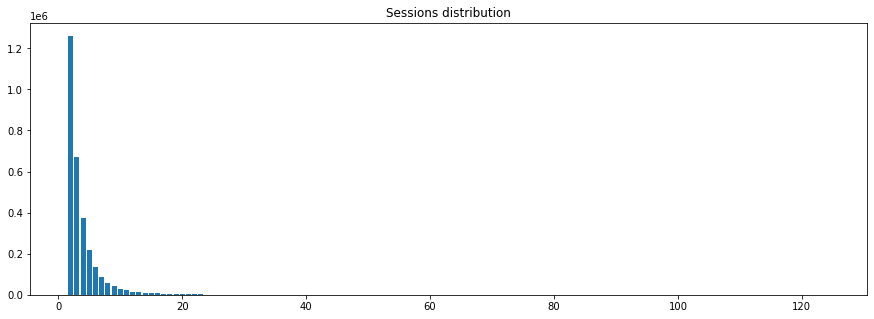

In [ ]:
session_sizes = df_clicks.groupby('session_size').size()

plt.figure(figsize=(15,5))
plt.bar(session_sizes.index,session_sizes.values)
plt.title('Sessions distribution')

plt.show()

In [ ]:
session_sizes

session_size
2      1260372
3       670185
4       374240
5       220105
6       135762
        ...   
94          94
98          98
106        106
107        107
124        124
Length: 72, dtype: int64

In [ ]:
df_clicks.sample(frac=0.01)["session_size"].plot(
    kind="histogram",
    title="Distribution of session sizes (sampling = 1%)",
    labels={
        "value": "Session size",
    },
    text_auto=True,
    marginal="box",
)

### Période des sessions

In [ ]:
df_clicks.groupby(df_clicks['session_start'].dt.strftime('%d/%m/ %a')).size().plot(kind='bar')

## Modèle de recommandation Content based

In [ ]:
# from random import randint
# from sklearn.metrics.pairwise import cosine_similarity

# def getnArticles(articles_embeddings, n, userID):

#     print('User ID is : ', userID)

#     var = df_clicks.loc[df_clicks['user_id'] == userID]['article_id'].to_list()
    
#     value = randint(0, len(var))
#     print('Random article read by the user is: ', var[value])
    
#     emb = articles_embeddings

#     for i in range (0, len(var)):
#         if i != value:
#             emb = pd.concat([emb.iloc[:var[i],:], emb.iloc[var[i]+1:,:]])
    
#     #temp = np.delete(emb, [value], 0)
#     temp = pd.concat([emb.iloc[:var[value],:], emb.iloc[var[value]+1:,:]])

#     distances = cosine_similarity([emb.loc[var[value]]], temp)[0]
    
#     reco_ids = np.argsort(distances)[::-1][0:n]
#     r = np.sort(distances)[::-1][0:n]
#     print('Recommended articles are: ')
    
#     return reco_ids.tolist(), r.tolist()

In [16]:
from random import randint
from sklearn.metrics.pairwise import cosine_similarity

def getnArticles(articles_embeddings, n, userID):

    print('User ID is : ', userID)

    var = df_clicks.loc[df_clicks['user_id'] == userID]['article_id'].to_list()
    
    value = randint(0, len(var)-1)

    print('Random article read by the user is: ', var[value])
    
    emb=articles_embeddings.reset_index().rename(columns={"index":"articles_id"})
    
    for i in range (0, len(var)):
        if i != value:
            emb=emb[~(emb['articles_id'] == var[i])]

    temp= emb[~(emb['articles_id'] == var[value])]

    temp_bis= temp.drop('articles_id',axis=1)
    emb_bis=emb.drop('articles_id',axis=1)


    distances = cosine_similarity([emb_bis.loc[var[value]]], temp_bis)[0]

    temp["similarity"]=distances
    df_reco=temp.sort_values("similarity", ascending=False).iloc[:n]
    df_reco=df_reco[["articles_id","similarity"]]
    
    print('Recommended articles are: ')
    
    return df_reco

In [ ]:
getnArticles(df_embeddings, 5, 1)

User ID is :  1
Random article read by the user is:  285719


C:\Users\aen1so\AppData\Local\Temp\ipykernel_24912\1073485786.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Recommended articles are: 


,articles_id,similarity
345924,345924,0.914770
280172,280172,0.900071
284832,284832,0.891795
284040,284040,0.891129
284669,284669,0.885845


In [ ]:
getnArticles(df_embeddings, 5, 100)

User ID is :  100
Random article read by the user is:  331293


C:\Users\aen1so\AppData\Local\Temp\ipykernel_24912\1073485786.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Recommended articles are: 


,articles_id,similarity
331835,331835,0.925981
332471,332471,0.917083
330980,330980,0.914954
331823,331823,0.912158
332453,332453,0.910694


## Modèle Collaborative Filtering

### Matrice user rating

In [17]:
clicks_articles = pd.merge(df_clicks, df_articles_meta, how='inner', on='article_id')

# Convert timestamp to datetime
clicks_articles['session_start'] = pd.to_datetime(clicks_articles['session_start'].dt.strftime('%Y/%m/%d'))
clicks_articles['click_timestamp'] = pd.to_datetime(clicks_articles['click_timestamp'].dt.strftime('%Y/%m/%d'))


print(clicks_articles.shape)
clicks_articles.head()

(2988181, 17)


,user_id,session_id,session_start,session_size,article_id,click_timestamp,click_environment,click_deviceGroup,click_os,click_country,click_region,click_referrer_type,filename,category_id,created_at_ts,publisher_id,words_count
0,0,1506825423271737,2017-10-01,2,157541,2017-10-01,4,3,20,1,20,2,0,281,2017-09-30,0,280
1,20,1506825727279757,2017-10-01,2,157541,2017-10-01,4,1,17,1,9,1,0,281,2017-09-30,0,280
2,44,1506826139185781,2017-10-01,5,157541,2017-10-01,4,1,17,1,12,1,0,281,2017-09-30,0,280
3,45,1506826142324782,2017-10-01,2,157541,2017-10-01,4,1,17,1,17,1,0,281,2017-09-30,0,280
4,76,1506826463226813,2017-10-01,2,157541,2017-10-01,4,3,2,1,21,1,0,281,2017-09-30,0,280


In [ ]:
clicks_articles.head()

,user_id,session_id,session_start,session_size,article_id,click_timestamp,click_environment,click_deviceGroup,click_os,click_country,click_region,click_referrer_type,filename,category_id,created_at_ts,publisher_id,words_count
0,0,1506825423271737,2017-10-01,2,157541,2017-10-01,4,3,20,1,20,2,0,281,2017-09-30,0,280
1,20,1506825727279757,2017-10-01,2,157541,2017-10-01,4,1,17,1,9,1,0,281,2017-09-30,0,280
2,44,1506826139185781,2017-10-01,5,157541,2017-10-01,4,1,17,1,12,1,0,281,2017-09-30,0,280
3,45,1506826142324782,2017-10-01,2,157541,2017-10-01,4,1,17,1,17,1,0,281,2017-09-30,0,280
4,76,1506826463226813,2017-10-01,2,157541,2017-10-01,4,3,2,1,21,1,0,281,2017-09-30,0,280


score implicite : le nombre de clics par article pondéré par le nombre total de clics par utilisateur.

In [ ]:
#df_clicks.rename(columns={'click_article_id':'article_id'}, inplace=True)

In [18]:
def get_ratings(clicks):
    count_user_article_clicks = clicks.reset_index().groupby(["user_id", "article_id"]).agg(COUNT_user_article_clicks=("index", "count"))
    
    count_user_clicks = clicks.reset_index().groupby(["user_id"]).agg(COUNT_user_clicks=("index", "count"))

    ratings = count_user_article_clicks.join(count_user_clicks, on="user_id")
    
    ratings["rating"] = ratings["COUNT_user_article_clicks"] / ratings["COUNT_user_clicks"]

    ratings = ratings.reset_index().drop(["COUNT_user_article_clicks","COUNT_user_clicks"], axis=1)
    
    return ratings

In [19]:
ratings = get_ratings(df_clicks)
ratings

,user_id,article_id,rating
0,0,68866,0.125
1,0,87205,0.125
2,0,87224,0.125
3,0,96755,0.125
4,0,157541,0.125
...,...,...,...
2950705,322894,168401,0.500
2950706,322895,63746,0.500
2950707,322895,289197,0.500
2950708,322896,30760,0.500


In [20]:
#Import librairies
from surprise import Reader
from surprise import Dataset
from surprise.model_selection import cross_validate
from surprise import NormalPredictor
from surprise import KNNBasic
from surprise import KNNWithMeans
from surprise import KNNWithZScore
from surprise import KNNBaseline
from surprise import SVD
from surprise import BaselineOnly
from surprise import SVDpp
from surprise import NMF
from surprise import SlopeOne
from surprise import CoClustering
from surprise.accuracy import rmse
from surprise import accuracy
from surprise.model_selection import train_test_split
from surprise.model_selection import GridSearchCV

In [21]:
reader = Reader(rating_scale=(0, 1))
data = Dataset.load_from_df(ratings[['user_id', 'article_id', 'rating']], reader)

<pre>
With the Surprise library, we will benchmark the following algorithms:
NormalPredictor
NormalPredictor algorithm predicts a random rating based on the distribution of the training set, which is assumed to be normal. This is one of the most basic algorithms that do not do much work.
BaselineOnly
BasiclineOnly algorithm predicts the baseline estimate for given user and item.
k-NN algorithms
KNNBasic
KNNBasic is a basic collaborative filtering algorithm.
KNNWithMeans
KNNWithMeans is basic collaborative filtering algorithm, taking into account the mean ratings of each user.
KNNWithZScore
KNNWithZScore is a basic collaborative filtering algorithm, taking into account the z-score normalization of each user.
KNNBaseline
KNNBaseline is a basic collaborative filtering algorithm taking into account a baseline rating.
Matrix Factorization-based algorithms
SVD
SVD algorithm is equivalent to Probabilistic Matrix Factorization (http://papers.nips.cc/paper/3208-probabilistic-matrix-factorization.pdf)
SVDpp
The SVDpp algorithm is an extension of SVD that takes into account implicit ratings.
NMF
NMF is a collaborative filtering algorithm based on Non-negative Matrix Factorization. It is very similar with SVD.
Slope One
Slope One is a straightforward implementation of the SlopeOne algorithm. (https://arxiv.org/abs/cs/0702144)
Co-clustering
Co-clustering is a collaborative filtering algorithm based on co-clustering (http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.113.6458&rep=rep1&type=pdf)
We use rmse as our accuracy metric for the predictions.
</pre>

In [269]:
benchmark = []
# Iterate over all algorithms

#algorithms = [SVD(), SVDpp(), SlopeOne(), NMF(), NormalPredictor(), KNNBaseline(), KNNBasic(), KNNWithMeans(), KNNWithZScore(), BaselineOnly(), CoClustering()]
algorithms = [BaselineOnly(), CoClustering(), SVD(), SVDpp(), SlopeOne(), NMF(), NormalPredictor()]

print ("Attempting: ", str(algorithms), '\n\n\n')

for algorithm in algorithms:
    print("Starting: " ,str(algorithm))
    # Perform cross validation
    results = cross_validate(algorithm, data, measures=['RMSE', 'MAE', 'fcp'], cv=5, verbose=False)
    
    # Get results & append algorithm name
    tmp = pd.DataFrame.from_dict(results).mean(axis=0)
    tmp = tmp.append(pd.Series([str(algorithm).split(' ')[0].split('.')[-1]], index=['Algorithm']))
    benchmark.append(tmp)
    print("Done: " ,str(algorithm), "\n\n")

print ('\n\tDONE\n')

Attempting:  [<surprise.prediction_algorithms.baseline_only.BaselineOnly object at 0x0000025676319F40>, <surprise.prediction_algorithms.co_clustering.CoClustering object at 0x0000025676319F10>, <surprise.prediction_algorithms.matrix_factorization.SVD object at 0x0000025676319FA0>, <surprise.prediction_algorithms.matrix_factorization.SVDpp object at 0x0000025676319CD0>, <surprise.prediction_algorithms.slope_one.SlopeOne object at 0x0000025676319EE0>, <surprise.prediction_algorithms.matrix_factorization.NMF object at 0x00000256763197F0>, <surprise.prediction_algorithms.random_pred.NormalPredictor object at 0x00000256763193A0>] 



Starting:  <surprise.prediction_algorithms.baseline_only.BaselineOnly object at 0x0000025676319F40>
Estimating biases using als...
Estimating biases using als...
Estimating biases using als...
Estimating biases using als...
Estimating biases using als...


C:\Users\aen1so\AppData\Local\Temp\ipykernel_24912\1390530521.py:16: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Done:  <surprise.prediction_algorithms.baseline_only.BaselineOnly object at 0x0000025676319F40> 


Starting:  <surprise.prediction_algorithms.co_clustering.CoClustering object at 0x0000025676319F10>


C:\Users\aen1so\AppData\Local\Temp\ipykernel_24912\1390530521.py:16: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Done:  <surprise.prediction_algorithms.co_clustering.CoClustering object at 0x0000025676319F10> 


Starting:  <surprise.prediction_algorithms.matrix_factorization.SVD object at 0x0000025676319FA0>


C:\Users\aen1so\AppData\Local\Temp\ipykernel_24912\1390530521.py:16: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Done:  <surprise.prediction_algorithms.matrix_factorization.SVD object at 0x0000025676319FA0> 


Starting:  <surprise.prediction_algorithms.matrix_factorization.SVDpp object at 0x0000025676319CD0>


C:\Users\aen1so\AppData\Local\Temp\ipykernel_24912\1390530521.py:16: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Done:  <surprise.prediction_algorithms.matrix_factorization.SVDpp object at 0x0000025676319CD0> 


Starting:  <surprise.prediction_algorithms.slope_one.SlopeOne object at 0x0000025676319EE0>


C:\Users\aen1so\AppData\Local\Temp\ipykernel_24912\1390530521.py:16: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Done:  <surprise.prediction_algorithms.slope_one.SlopeOne object at 0x0000025676319EE0> 


Starting:  <surprise.prediction_algorithms.matrix_factorization.NMF object at 0x00000256763197F0>


C:\Users\aen1so\AppData\Local\Temp\ipykernel_24912\1390530521.py:16: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Done:  <surprise.prediction_algorithms.matrix_factorization.NMF object at 0x00000256763197F0> 


Starting:  <surprise.prediction_algorithms.random_pred.NormalPredictor object at 0x00000256763193A0>
Done:  <surprise.prediction_algorithms.random_pred.NormalPredictor object at 0x00000256763193A0> 



	DONE



C:\Users\aen1so\AppData\Local\Temp\ipykernel_24912\1390530521.py:16: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [270]:
pd.set_option('display.float_format', lambda x: '%.10f' % x)
surprise_results = pd.DataFrame(benchmark).set_index('Algorithm').sort_values('test_rmse')
surprise_results

,test_rmse,test_mae,test_fcp,fit_time,test_time
Algorithm,,,,,
SlopeOne,0.0498929960,0.0077107530,0.5083768794,47.0293458462,14.0704480171
NMF,0.0769877123,0.0438134844,0.5303980111,59.7723424911,5.5019235134
BaselineOnly,0.0996773962,0.0621317640,0.5281702566,12.4067699432,4.2724317551
CoClustering,0.1646549195,0.1074559901,0.5231364339,83.1924685955,4.4791666031
NormalPredictor,0.1692140119,0.1266633335,0.5017682595,4.1489496231,4.9193832874
SVD,0.1748725985,0.1474516856,0.5083920913,27.9512369633,5.4676265240
SVDpp,0.1761060856,0.1480002921,0.5107321627,80.9007581234,21.8374959946


SVD is performing best, so we will use it and apply GridSearch CV.

In [301]:
# param_grid = {
#     "n_factors":[20, 30, 40, 60, 80, 100],
#     "n_epochs": [5, 10, 20, 30, 40, 50, 100],
#     "lr_all": [0.001, 0.002, 0.005],
#     "reg_all": [0.02, 0.08, 0.4, 0.6]
# }
param_grid = {
    "n_factors":[20, 40, 100],
    "n_epochs": [10, 20, 50],
    "lr_all": [0.001, 0.002],
    #"reg_all": [0.02, 0.08]
}

#smaller grid for testing
# param_grid = {
#     "n_factors": [40,100],
#     "n_epochs": [10, 20],
#     "lr_all": [0.002, 0.005],
#     "reg_all": [0.02]
# }
gs = GridSearchCV(SVD, param_grid, measures=["rmse", "mae","fcp"], refit=True, cv=5)

gs.fit(data)

training_parameters = gs.best_params["rmse"]

print("BEST RMSE: \t", gs.best_score["rmse"])
print("BEST MAE: \t", gs.best_score["mae"])
print("BEST FCP: \t", gs.best_score["fcp"])
print("BEST params: \t", gs.best_params["rmse"])

BEST RMSE: 	 0.13016846813577937
BEST MAE: 	 0.10143076948543668
BEST FCP: 	 0.5114064881669781
BEST params: 	 {'n_factors': 20, 'n_epochs': 50, 'lr_all': 0.001}


In [302]:
param_grid_nmf = {
    "n_factors": [10, 15, 40],
    "n_epochs": [10, 20, 50],
}

#for testing:
# param_grid_nmf = {
#     "n_factors": [10,15],
#     "n_epochs": [10, 20],
#     #"lr_all": [0.002, 0.005],
#     #"reg_all": [0.02]
# }
gs_nmf = GridSearchCV(NMF, param_grid_nmf, measures=["rmse", "mae","fcp"], refit=True, cv=5)

gs_nmf.fit(data)

training_parameters_nmf = gs_nmf.best_params["rmse"]

print("BEST RMSE: \t", gs_nmf.best_score["rmse"])
print("BEST MAE: \t", gs_nmf.best_score["mae"])
print("BEST FCP: \t", gs_nmf.best_score["fcp"])
print("BEST params: \t", gs_nmf.best_params["rmse"])

BEST RMSE: 	 0.07698626987252741
BEST MAE: 	 0.04380618530295792
BEST FCP: 	 0.5339984156329768
BEST params: 	 {'n_factors': 15, 'n_epochs': 50}


In [263]:
ratings.describe()

,user_id,article_id,rating
count,2950710.0000000000,2950710.0000000000,2950710.0000000000
mean,108392.0823717004,195029.7183105083,0.1094302727
std,83728.9499443549,90833.4299489047,0.1295019438
min,0.0000000000,3.0000000000,0.0008116883
25%,40720.0000000000,124228.0000000000,0.0270270270
50%,86830.0000000000,202388.0000000000,0.0588235294
75%,163975.0000000000,277068.0000000000,0.1250000000
max,322896.0000000000,364046.0000000000,0.5000000000


In [305]:
from datetime import datetime
print(training_parameters)
reader = Reader(rating_scale=(0, 1))

data = Dataset.load_from_df(ratings[['user_id', 'article_id', 'rating']], reader)

trainset = data.build_full_trainset()


startTraining = datetime.now()

algo = SVD(n_epochs = training_parameters['n_epochs'], lr_all = training_parameters['lr_all'], n_factors = training_parameters['n_factors'])

algo.fit(trainset)

endTraining = datetime.now()
print("> OK \t\t It Took: ", (endTraining-startTraining).seconds, "seconds")

{'n_factors': 20, 'n_epochs': 50, 'lr_all': 0.001}
> OK 		 It Took:  26 seconds


In [306]:
from datetime import datetime
print(training_parameters_nmf)
reader = Reader(rating_scale=(0, 1))

data = Dataset.load_from_df(ratings[['user_id', 'article_id', 'rating']], reader)

trainset = data.build_full_trainset()


startTraining = datetime.now()

algo_nmf = NMF(n_factors = training_parameters_nmf['n_factors'], n_epochs = training_parameters_nmf['n_epochs'])

algo_nmf.fit(trainset)

endTraining = datetime.now()
print("> OK \t\t It Took: ", (endTraining-startTraining).seconds, "seconds")

{'n_factors': 15, 'n_epochs': 50}
> OK 		 It Took:  48 seconds


In [307]:
## SAVING TRAINED MODEL
from surprise import dump
import os
model_filename = "./model_svd.pickle"
print (">> Starting dump")
# Dump algorithm and reload it.
file_name = os.path.expanduser(model_filename)
dump.dump(file_name, algo=algo)
print (">> Dump done")
print(model_filename)

>> Starting dump
>> Dump done
./model_svd.pickle


In [308]:
model_filename = "./model_nmf.pickle"
print (">> Starting dump")
# Dump algorithm and reload it.
file_name = os.path.expanduser(model_filename)
dump.dump(file_name, algo=algo_nmf)
print (">> Dump done")
print(model_filename)

>> Starting dump
>> Dump done
./model_nmf.pickle


In [22]:
## LOAD SAVED MODEL
def load_model(model_filename):
    print (">> Loading dump")
    from surprise import dump
    import os
    file_name = os.path.expanduser(model_filename)
    _, loaded_model = dump.load(file_name)
    print (">> Loaded dump")
    return loaded_model

In [23]:
algo_model_nmf=load_model("model_nmf.pickle")

>> Loading dump
>> Loaded dump


In [24]:
algo_model_svd=load_model("model_svd.pickle")

>> Loading dump
>> Loaded dump


In [26]:
def recommend_articles(data, algo, uid, topn=5):
    # Get the item IDs to ignore for the given user
    user_items_to_ignore = set(data.loc[data.user_id == uid].article_id)
    
    # Create a DataFrame of items to predict, excluding the ignored item IDs
    items_to_predict = pd.DataFrame(set(data.article_id) - user_items_to_ignore, columns=['article_id'])
    
    # Predict the ratings for the items using the algorithm
    items_to_predict['pred'] = items_to_predict['article_id'].apply(lambda x: algo.predict(uid=uid, iid=x)[3])
    
    # Sort the predicted ratings in descending order
    recommendations_df = items_to_predict.loc[:, ['article_id', 'pred']].sort_values(by='pred', ascending=False)
    
    if topn == 0:
        # Return all recommendations if topn is 0
        return recommendations_df
    else:
        # Return top n recommendations
        return recommendations_df.head(topn)

In [27]:
recommend_articles(ratings, algo_model_nmf, 1, 5)

,article_id,pred
40984,106982,0.132710
11513,162888,0.125543
19037,50601,0.124807
4539,145117,0.124699
22542,61410,0.123000


In [28]:
recommend_articles(ratings, algo_model_svd, 1, 5)

,article_id,pred
32859,87144,0.426456
15604,303269,0.379154
25844,331116,0.336004
19930,184044,0.333827
299,263635,0.327959


In [32]:
recommend_articles(ratings, algo_model_nmf, 3600, 5)

,article_id,pred
40968,106982,0.055319
11503,162888,0.052311
19024,50601,0.052026
4537,145117,0.051982
22530,61410,0.051269


In [30]:
recommend_articles(ratings, algo_model_svd, 1000, 5)

,article_id,pred
25850,331116,0.372066
29073,76000,0.360128
36335,96210,0.351166
19662,183176,0.339302
33881,89762,0.338556


In [289]:
algo_model_svd=load_model("model_svd.pickle")

>> Loading dump
>> Loaded dump


In [290]:
recommend_articles(ratings, algo_model_svd, 1, 5)

,article_id,pred
40657,237592,0.5720004190
17318,307833,0.5522800659
23120,62760,0.5278695468
11324,31381,0.4972026799
16324,304543,0.4968115932


In [291]:
recommend_articles(ratings, algo_model_svd, 1000, 5)

,article_id,pred
431,264036,0.4710469220
43315,250033,0.4529598776
22812,193216,0.4519434211
18114,179063,0.4493228664
33858,89734,0.4458544658


In [298]:
recommend_articles(ratings, algo_model_svd, 3268, 5)

,article_id,pred
9752,28195,0.5066394512
38158,100901,0.4637720785
15246,302227,0.4307707579
36521,96581,0.4292957505
40697,106578,0.4206621387


In [292]:
data_v=ratings
algo=algo_model
topn=5
uid=1

In [293]:
# Get the item IDs to ignore for the given user
user_items_to_ignore = set(data_v.loc[data_v.user_id == uid].article_id)
user_items_to_ignore

{36162,
 59758,
 96663,
 156723,
 160474,
 183176,
 205973,
 234481,
 235840,
 283392,
 285719,
 327984}

In [294]:
data_v.loc[data_v.user_id == uid].article_id

8      36162
9      59758
10     96663
11    156723
12    160474
13    183176
14    205973
15    234481
16    235840
17    283392
18    285719
19    327984
Name: article_id, dtype: int64

In [295]:
# Create a DataFrame of items to predict, excluding the ignored item IDs
items_to_predict = pd.DataFrame(set(data_v.article_id) - user_items_to_ignore, columns=['article_id'])
items_to_predict

,article_id
0,3
1,27
2,262171
3,262181
4,262188
...,...
46016,262064
46017,262072
46018,262101
46019,234457


In [296]:
items_to_predict['pred'] = items_to_predict['article_id'].apply(lambda x: algo.predict(uid=uid, iid=x)[3])
items_to_predict

,article_id,pred
0,3,0.0940985474
1,27,0.0110977099
2,262171,0.0681342298
3,262181,0.0462093844
4,262188,0.0000299683
...,...,...
46016,262064,0.0319746520
46017,262072,0.0027212235
46018,262101,0.0012111938
46019,234457,0.0224476908


In [297]:
items_to_predict.describe()

,article_id,pred
count,46021.0000000000,46021.0000000000
mean,173970.8714065318,0.0418888480
std,103202.3927773028,0.0297879196
min,3.0000000000,0.0000000365
25%,83513.0000000000,0.0132223398
50%,167165.0000000000,0.0421767750
75%,264671.0000000000,0.0658177177
max,364046.0000000000,0.1285439698
